### Теорія

Згорткові нйронні мережі працюють на основі фільтрів (ядер), які займаються роспізнаванням ознак. Фільтр - це матриця вагів (її розмірність, kernel size є параметром для налаштування) , його переміщують вздовж зображення з певним кроком (**strides**, крок можна задавати в ширину та висоту). Потім відбувається операція згортки: береться сума взважених значень пікселів (якщо це зображення)

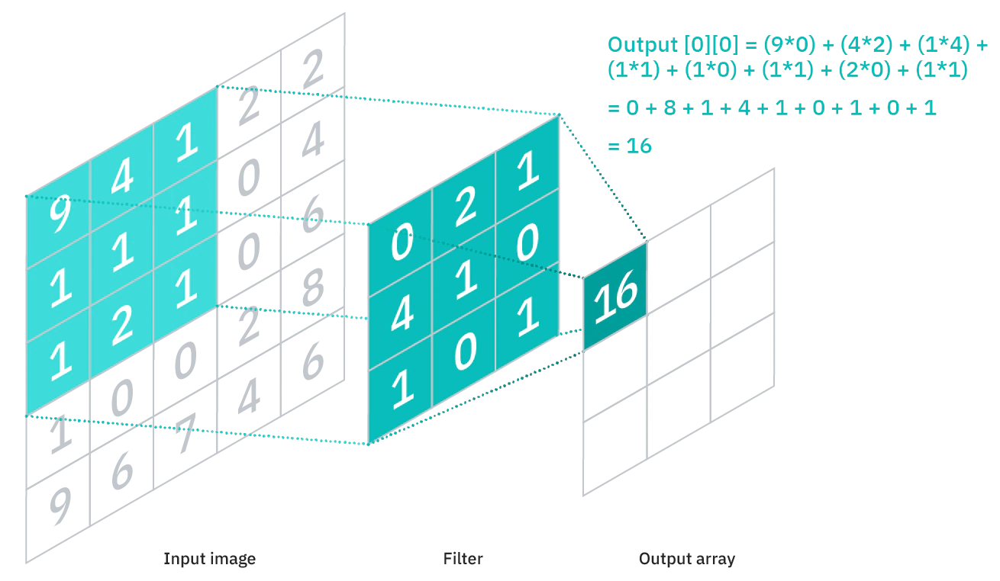

Якщо деяка потрібна характеристика присутня у фрагменті зображення, операція згортки на виході видаватиме число з відносно великим значенням. Якщо ж характеристика відсутня, вихідне число буде невеликим. Потім до цього числа застосовується нелінійна функція активації.       
На кожному згортковому шарі може бути будь-яка кількість фільтрів.    
                    
Операція згортки зменшує зображення. Також пікселі, які знаходяться на межі зображення, беруть участь у меншій кількості операцій, ніж внутрішні. Такий спосіб називається "'valid", коректна згортка. У зв'язку з цим у згорткових шарах використовується доповнення зображення (padding). Виходи з попереднього шару доповнюються пікселями (значення яких зазвичай беруть рівним 0) так, щоб після згортки зберігся розмір зображення. Такий спосіб називається "same".

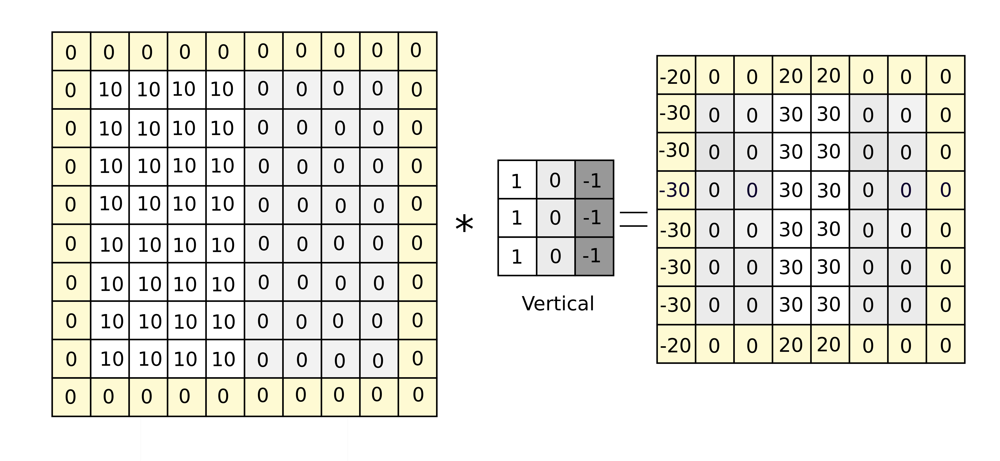

З метою прискорення процесу навчання та зменшення обчислювальних операцій використовують шари субдискретизації. Найвживаніший з них - максимальне об'єднання (max pooling).

Операція максимального об'єднання аналогічна операції згортки, тільки замість зваженох суми ми обираємо просто максимальне число з локального рецепторного поля. Окрім оптимізації за обчисленнями, цей шар дає можливість концентруватися на дійсно вагомих ознаках зображення, відкидаючи несуттєві деталі. Зазвичай такий шар використовую з доповненням "valid".

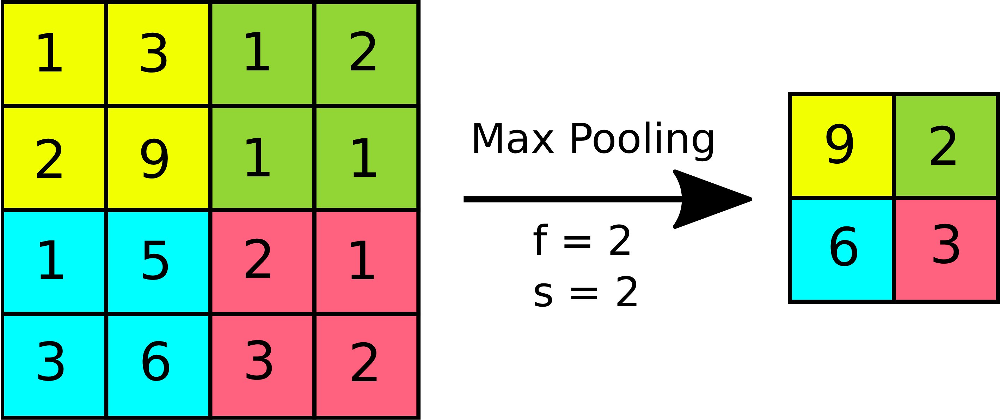


Типова згорткова нейронна мережа складається з набору згорткових шарів, які "розбавляють" шарами субдискретизації, причому чим далі, тим більше фільтрів для згортки використовують. Тобто, з одного боку, поступово зменшується розмір виходу у ширину та висоту, але він стає глибшим. У якийсь момент отриманий тензор перетворюють на вектор, та настає час повнозв'язних шарів.

In [ ]:
import os
from PIL import Image
import time
import random
import string

import numpy as np
import pandas as pd
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, f1_score, precision_score, recall_score, roc_auc_score

import matplotlib.pyplot as plt
%matplotlib inline

In [ ]:
import tensorflow.compat.v1 as tf

import warnings
warnings.filterwarnings("ignore")
tf.get_logger().setLevel('FATAL')

tf.disable_v2_behavior()
from tensorflow.python.ops import math_ops

### Дані

In [ ]:
from tensorflow.keras.datasets import mnist

In [ ]:
(X_train, y_train), (X_test, y_test) = mnist.load_data()
X_train, X_test = X_train / 255., X_test / 255.

In [ ]:
X_train, X_test = X_train.reshape(*X_train.shape, 1), X_test.reshape(*X_test.shape, 1)
print(f"Train set shape: {X_train.shape}, test set shape: {X_test.shape}.")

Train set shape: (60000, 28, 28, 1), test set shape: (10000, 28, 28, 1).


In [ ]:
!pip install opendatasets

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import opendatasets as od

od.download("https://www.kaggle.com/datasets/prasunroy/natural-images")

Please provide your Kaggle credentials to download this dataset. Learn more: http://bit.ly/kaggle-creds
Your Kaggle username: dariadenhub
Your Kaggle Key: ··········


100%|██████████| 342M/342M [00:01<00:00, 196MB/s]


In [ ]:
!rm -r /content/natural-images/data

In [ ]:
DATASET_DIR = "/content/natural-images/natural_images"

# Знаходимо мітки класів та відповідні їм шляхи до зображень
labels = os.listdir(DATASET_DIR)
file_names = []
for label in labels:
    label_files = [f"{DATASET_DIR}/{label}/{name}" for name in os.listdir(f"{DATASET_DIR}/{label}")]
    file_names.append(label_files)

# Утворюємо датафрейм, де для кожного файлу вказана його мітка
dataset = pd.DataFrame({"label": labels, "file_path": file_names})

dataset = dataset.file_path.apply(pd.Series) \
    .merge(dataset, right_index=True, left_index=True) \
    .drop(["file_path"], axis = 1) \
    .melt(id_vars = ['label'], value_name = "file_path") \
    .drop(["variable"], axis=1)

dataset = dataset[dataset['file_path'].notna()]

# Перетворюємо назви категорій на їх послідовний номер
dataset['label'].replace(labels, list(range(len(labels))), inplace=True)

train_df,test_df = train_test_split(dataset, test_size=0.2,random_state=0)


In [ ]:
def plot_image(path):
    img_ = Image.open(path)
    img__ = np.asarray(img_, dtype='float32') / 255.
    imgplot = plt.imshow(img__)
    img_.close()

def image_to_array(file_path, width, height, mode=None):
    img = Image.open(file_path)
    if mode:
        img = img.convert(mode, dither=Image.NONE)
    img = img.resize((width, height))
    data = np.asarray(img,dtype='float32')
    img.close()
    return data

def get_data(frame, width=128, height=128):
    X_data = []
    y_data = []
    for img_path, label in zip(frame["file_path"].to_list(), frame["label"].to_list()):
        img_data = image_to_array(img_path, width, height)
        X_data.append(img_data), y_data.append(label)

    X_data, y_data = np.array(X_data), np.array(y_data)
    return X_data / 255., np.array(y_data) 

X_train_b, y_train_b = get_data(train_df)
X_test_b, y_test_b = get_data(test_df)

print(f"Shape of the train set: {X_train_b.shape}.")

### Код моделі

In [ ]:
def get_random_name(k=20):
  return ''.join(random.choices(string.ascii_letters + string.digits, k=20))

def shuffle_batch(batch_size, *arrays, shuffle=True):
    n_arrays = len(arrays)
    if n_arrays == 0:
        return
    length = arrays[0].shape[0]

    if shuffle:
        rnd_idx = np.random.permutation(length)
    else:
        rnd_idx = list(range(length))

    n_batches = length // batch_size
    
    for batch_idx in np.array_split(rnd_idx, n_batches):
        if n_arrays == 1:
            yield arrays[0][batch_idx]
        else:
            yield (array[batch_idx] for array in arrays)

In [ ]:
class CustomCNN:
    def __init__(self, conv_layers=[], dense_layers=[], max_epochs=10, batch_size=512,
               optimizer=tf.train.GradientDescentOptimizer, op_params={"learning_rate": 0.01},
               kernel_initializer=tf.initializers.random_normal, activation=tf.nn.relu,
               batch_normalization=False, dropout=None, l1=None, l2=None, 
               max_norm=None, early_stopping=False, requires_no_improvement=5,
               threshold=1e-5, device_name="/device:CPU:0", verbose=False, 
               tensorboard_logs=False, model_name=None, restore=False):
        if restore:
            if not model_name:
                raise Exception("Cannot restore model when its name is None.")
            self._name = model_name
            self._graph = self._restore_model()

        else:
            self._graph = tf.Graph()
            self._name = f"model-{get_random_name()}"

            self._conv_layers = self._parse_conv_params(conv_layers)
            self._dense_layers = dense_layers
            self._batch_size = batch_size
            self._max_epochs = max_epochs

            # додаємо оптимізатор до тимчасової колекції, оскільки в графі він сам не зберігається
            with self._graph.as_default():
                self._graph.add_to_collection("tmp", optimizer(**op_params, name="optimizer"))

            self._kernel_initializer = kernel_initializer
            self._activation = activation
            self._batch_normalization = batch_normalization
            self._dropout = self._tuples_to_dict(dropout)

            self._l1 = l1 if l1 else 0.
            self._l2 = l2 if l2 else 0.
            self._max_norm = tf.keras.constraints.MaxNorm(max_norm) if max_norm else None

            self._early_stopping = early_stopping
            self._requires_no_improvement = requires_no_improvement 
            self._threshold = threshold 

            self._verbose = verbose 
            self._tensorboard_logs = tensorboard_logs
            self._saver = None
            self._device_name = device_name 

    def _tuples_to_dict(self, dropout):
        drp = {}

        try:
            for obj in dropout:
                drp[str(obj[0])] = obj[1]
        except:
            pass

        return drp

    def _parse_conv_params(self, conv_layers):
        conv_keys = ["filters", "kernel_size", "strides", "padding"]
        pool_keys = ["pool_size", "strides", "padding"]

        conv_params = []

        if not conv_layers:
            return conv_params

        layer_types = conv_layers["type"]
        for i, type_ in enumerate(layer_types):
            if type_ == "conv":
                params_values = [conv_layers[param][i] for param in conv_keys]
                params_dict= {"func": tf.layers.conv2d, "params": dict(zip(conv_keys, params_values))}
            elif type_ == "average_pool":
                params_values = [conv_layers[param][i] for param in conv_keys if param != "filters"]
                params_dict= {"func": tf.layers.average_pooling2d, "params": dict(zip(pool_keys, params_values))}
            elif type_ == "max_pool":
                params_values = [conv_layers[param][i] for param in conv_keys if param != "filters"]
                params_dict= {"func": tf.layers.max_pooling2d, "params": dict(zip(pool_keys, params_values))}
            else:
                raise Exception(f"Invalid layer type: {type_}.")
            
            conv_params.append(params_dict)

        return conv_params

    @property
    def _eval_dropout(self):
        drp_keys = list(self._dropout.keys())
        drp_values = [0. for j in range(len(drp_keys))]
        return dict(zip(drp_keys, drp_values))

    def _restore_model(self):
        model_graph = tf.Graph()

        with model_graph.as_default():
            self._saver = tf.train.import_meta_graph(f"models/{self._name}/{self._name}.meta")
        
            with tf.Session(graph=model_graph) as sess:
                self._saver.restore(sess, f"models/{self._name}/{self._name}")
                self._dense_layers = sess.run("n_hidden_units:0")
                self._batch_size = sess.run("batch_size:0")
                self._max_epochs = sess.run("max_epochs:0")
                self._verbose = sess.run("verbose:0")
                self._l1 = sess.run("l1:0")
                self._l2 = sess.run("l2:0")
                self._early_stopping = sess.run("early_stopping:0")
                self._requires_no_improvement = sess.run("requires_no_improvement:0")
                self._threshold = sess.run("threshold:0")
                self._tensorboard_logs = sess.run("tensorboard_logs:0")
                rate_names = sess.run("rate_names:0")
                rate_values = sess.run("rate_values:0")
                self._dropout = dict(zip(rate_names, rate_values))

        return model_graph

    def _save_params_to_graph(self):

        with self._graph.as_default():
            tf.constant(self._dense_layers, name="n_hidden_units")
            tf.constant(self._batch_size, name="batch_size")
            tf.constant(self._max_epochs, name="max_epochs")
            tf.constant(self._verbose, name="verbose")
            tf.constant(self._l1, name="l1")
            tf.constant(self._l2, name="l2")
            tf.constant(self._early_stopping, name="early_stopping")
            tf.constant(self._requires_no_improvement, name="requires_no_improvement")
            tf.constant(self._threshold, name="threshold")
            tf.constant(self._tensorboard_logs, name="tensorboard_logs")
            tf.constant(list(self._dropout.keys()), name="rate_names")
            tf.constant(list(self._dropout.values()), name="rate_values")

    def _init_model(self, n_width, n_height, n_outputs, n_channels):
        with tf.device(self._device_name):
            with self._graph.as_default():
                X = tf.placeholder(tf.float32, shape=(None, n_height, n_width,  n_channels), name="X")
                y = tf.placeholder(tf.int32, shape=(None, ), name="y_real")

                named_dropout = {}
                conv_layers_num = len(self._conv_layers)
                layers = self._conv_layers + self._dense_layers

                common_params = {"activation": self._activation,
                                  "kernel_initializer": self._kernel_initializer,
                                 "kernel_constraint": self._max_norm}

                with tf.name_scope("layers"):
                    layer = X
                  
                    for i, params in enumerate(layers):
                        if self._batch_normalization:
                            layer = tf.layers.batch_normalization(layer, name=f"normalization{i+1}")
                        if i < conv_layers_num:
                            if params["func"] == tf.layers.conv2d:
                                layer = params["func"](layer, kernel_size=params["params"]["kernel_size"], filters=params["params"]["filters"],
                                                       strides=params["params"]["strides"], padding=params["params"]["padding"], **common_params,
                                                        name=f"conv{i + 1}")
                            else:
                                layer = params["func"](layer, pool_size=params["params"]["pool_size"], strides=params["params"]["strides"],
                                                       padding=params["params"]["padding"], name=f"pooling{i + 1}")
                                
                        
                        else:
                            # if i == conv_layers_num:
                            #     layer = tf.layers.flatten(layer, name="flatten")

                            layer = tf.layers.dense(layer, params, **common_params,
                                                name=f"hidden{i + 1}")
                            
                        if i == conv_layers_num - 1:
                            layer = tf.layers.flatten(layer, name="flatten")
                        
                        if str(i) in self._dropout.keys():
                            name = f"rate{i}"
                            named_dropout[f"layers/{name}:0"] = self._dropout[str(i)]
                            layer = tf.layers.dropout(layer, 
                                                        rate=tf.placeholder(tf.float32,  name=name), 
                                                        training=True, name=f"dropout{i+1}")
                    
                    self._dropout = named_dropout
                        
                    logits = tf.layers.dense(layer, n_outputs, activation=None,
                                            kernel_initializer = self._kernel_initializer,
                                            name="outputs")
                    
                    y_proba = tf.nn.softmax(logits, name="y_proba")

                with tf.name_scope("loss"):
                    xentropy = tf.nn.sparse_softmax_cross_entropy_with_logits(labels=y, logits=logits)
                    loss = tf.reduce_mean(xentropy, name="loss") #+ self._regularizer(self._batch_size)

                with tf.name_scope("train"):
                    training_op = self._graph.get_collection("tmp")[0].minimize(loss, name="training_op")
        
                with tf.name_scope("eval"):
                    correct = tf.nn.in_top_k(logits, y, 1)
                    accuracy = tf.reduce_mean(tf.cast(correct, tf.float32), name="accuracy")

                if self._tensorboard_logs:
                    accuracy_ph = tf.placeholder(dtype=np.float32, name="accuracy_ph")
                    loss_ph = tf.placeholder(dtype=np.float32, name="loss_ph")
                    valid_ph = tf.placeholder(dtype=np.float32, name="valid_ph")

                    with tf.name_scope("tensorboard"):
                        tf.summary.scalar('train accuracy', accuracy_ph)
                        tf.summary.scalar('loss', loss_ph)
                        tf.summary.scalar('validation accuracy', valid_ph)

                self._graph.clear_collection("tmp")
                self._save_params_to_graph()
    
    def weights(self, in_session=False):
        try:
            weights_dict = dict()
            weights_arr = self._graph.get_collection("trainable_variables")
        
            for weight in weights_arr:
                if ("hidden" in weight.name or "conv" in weight.name) and ("kernel" in weight.name or "bias" in weight.name):
                    layer_name, w_type = weight.name.split("/")
                    w_type = w_type.split(":")[0]
                    try:
                        weights_dict[f"layer_{layer_name}"][w_type] = weight
                    except:
                        weights_dict[f"layer_{layer_name}"] = {w_type: weight}

            if in_session:
                with tf.Session(graph=self._graph) as sess:
                    sess.run(tf.global_variables_initializer())
                    if self._saver and os.path.exists(f"models/{self._name}/{self._name}.meta"):
                        self._saver.restore(sess, f"models/{self._name}/{self._name}")

                    for layer in weights_dict.keys():
                        for w_type in weights_dict[layer].keys():
                            weights_dict[layer][w_type] = weights_dict[layer][w_type].eval()

            return weights_dict

        except Exception as e:
            print(e) 

    def _regularizer(self, m):
        l1=self._l1
        l2=self._l2

        if l1 == 0 and l2 == 0:
            return tf.constant(0.)

        weights_dict = self.weights()

        l1_regularization = 0.
        l2_regularization = 0.

        for layer in weights_dict.keys():
            if l1 != 0:
                l1_regularization += math_ops.reduce_sum(math_ops.abs(weights_dict[layer]["kernel"])) 
                l1_regularization += math_ops.reduce_sum(math_ops.abs(weights_dict[layer]["bias"]))
            if l2 != 0:
                l2_regularization += math_ops.reduce_sum(math_ops.square(weights_dict[layer]["kernel"])) 
                l2_regularization += math_ops.reduce_sum(math_ops.square(weights_dict[layer]["bias"]))

        return (1 / (2 * m)) * (l1 * l1_regularization + l2 * l2_regularization)

    @property
    def name(self):
        return self._name
    
    def train(self, X_input, y_input, validation_split=0.1, return_scores=False, return_time=False):
        if self._verbose:
            print(f"Training model: {self._name}")
        total_time_start = time.time()

        if len(X_input.shape) == 3:
            X_input = X_input[:, :, :, None]

        n_height, n_width = X_input.shape[1], X_input.shape[2]
        n_channels = X_input.shape[3]
        n_outputs = len(np.unique(y_input))

        if not self.weights():
            self._init_model( n_width, n_height, n_outputs, n_channels)

        X_train_, X_valid_, y_train_, y_valid_ = train_test_split(X_input, y_input, test_size=validation_split, random_state=0)

        with tf.Session(graph=self._graph) as sess:
            sess.run(tf.global_variables_initializer())
            if self._saver:
                self._saver.restore(sess, f"models/{self._name}/{self._name}")
            else:
                self._saver = tf.train.Saver()

            if self._tensorboard_logs:
                writer = tf.summary.FileWriter(f"/content/models/{self._name}/")
                writer.add_graph(self._graph)
                summary_op = tf.summary.merge_all(name="summary_op")

            if self._early_stopping:
                no_improvs_left = self._requires_no_improvement
                prev_loss = np.inf

            for epoch in range(self._max_epochs):
                epoch_time_start = time.time()

                for X_batch, y_batch in shuffle_batch(self._batch_size, X_train_, y_train_):
                    sess.run("train/training_op", feed_dict={"X:0": X_batch, "y_real:0": y_batch, **self._dropout})
                
                self._saver.save(sess, f"models/{self._name}/{self._name}")

                loss_value, train_accuracy = self.score(X_train_, y_train_)
                validation_loss, validation_accuracy = self.score(X_valid_, y_valid_)
                # loss_value, train_accuracy = sess.run(["loss/loss:0", "eval/accuracy:0"], feed_dict={"X:0": X_train_, "y_real:0": y_train_, **self._eval_dropout})
                # validation_accuracy = sess.run("eval/accuracy:0", feed_dict={"X:0": X_valid_, "y_real:0": y_valid_, **self._eval_dropout})
                epoch_time_end = time.time()

                if self._tensorboard_logs:
                    writer.add_summary(sess.run(summary_op,
                                                feed_dict={"accuracy_ph:0": train_accuracy,
                                                            "loss_ph:0": loss_value,
                                                            "valid_ph:0": validation_accuracy}),
                                                global_step=epoch)
                    writer.flush()

                if self._verbose:
                    print(f"{epoch} epoch - loss: {loss_value:.5}, " + \
                            f"train acc: {train_accuracy:.5}, " + \
                            f"validation acc: {validation_accuracy:.5}, "+ \
                            f"time: {(epoch_time_end - epoch_time_start):.5}s")

                if self._early_stopping:
                    if prev_loss - loss_value < self._threshold:
                        no_improvs_left -= 1
                    else:
                        no_improvs_left = self._requires_no_improvement
                    
                    if no_improvs_left == 0:
                        if self._verbose:
                            print("Early stopping...")
                        break
                
                    prev_loss = loss_value

            if self._tensorboard_logs:
                
                writer.close()

        total_time_end = time.time()
        if self._verbose:
            print(f"Total training time: {(total_time_end - total_time_start):.3}s")

        if return_scores and return_time:
            return (train_accuracy, validation_accuracy), (total_time_end - total_time_start)

        if return_scores:
            return (train_accuracy, validation_accuracy)

        if return_time:
            return (total_time_end - total_time_start)

    def predict_proba(self, X_input):
        with tf.Session(graph=self._graph) as sess:
            sess.run(tf.global_variables_initializer())
            if self._saver:
                self._saver.restore(sess, f"models/{self._name}/{self._name}")
            else:
                raise Exception("This instance of CustomDNN is not fitted yet, please, train model first")
            
            probas = []
            for x_batch in shuffle_batch(min(self._batch_size, len(X_input)), X_input, shuffle=False):
                # p = sess.run("layers/y_proba:0",  feed_dict={"X:0": X_input, **self._eval_dropout})
                p = sess.run("layers/y_proba:0",  feed_dict={"X:0": x_batch, **self._eval_dropout})
                probas += list(p)
           
            return np.array(probas)

    def predict(self, X_input, return_time=False):
        start_time = time.time()
        probs = self.predict_proba(X_input)
        end_time = time.time()

        if self._verbose:
            print(f"Total prediction time: {(end_time - start_time):.5}")

        if return_time:
            return np.argmax(probs, axis=1), end_time - start_time
        
        return np.argmax(probs, axis=1)

    def score(self, X_input, y_input):
        with tf.Session(graph=self._graph) as sess:
            sess.run(tf.global_variables_initializer())
            if self._saver:
                try:
                    self._saver.restore(sess, f"models/{self._name}/{self._name}")
                except ValueError:
                    pass
            else:
                raise Exception("This instance of CustomDNN is not fitted yet, please, train model first")
            
            loss, accuracy = [], []
            for x_batch, y_batch in shuffle_batch(self._batch_size, X_input, y_input):
                l, a = sess.run(["loss/loss:0", "eval/accuracy:0"], feed_dict={"X:0": x_batch, "y_real:0": y_batch, **self._eval_dropout})
                loss.append(l)
                accuracy.append(a)

            return np.mean(loss), np.mean(accuracy)

    def graph_collections(self, name=None):
        if name:
            return self._graph.get_collection(name)
        else:
            return self._graph.get_all_collection_keys()


### Допоміжні функції

In [ ]:
import seaborn as sns
from sklearn.metrics import confusion_matrix, f1_score, precision_score, recall_score

def scoring(y_true, y_pred, labels=None, average=[None], print_res=False):
    
    conf_mat = confusion_matrix(y_true, y_pred)
    con_mat = pd.DataFrame(conf_mat, index=labels, columns=labels)
    
    score = dict()
    for avg in average:
        score[avg] = {"Precision" : precision_score(y_true, y_pred, average=avg),
                    "Recall" : recall_score(y_true, y_pred, average=avg),
                    "F1-score" : f1_score(y_true, y_pred, average=avg)}
        
    if print_res:
        score_df = pd.DataFrame(score)
        plt.figure(figsize=(8,8))
        plt.title("Confusion matrix", fontsize=16)
        sns.heatmap(con_mat, annot=True, annot_kws={"size": 16}, fmt='g', cmap='Blues', cbar=False)
        plt.ylabel("Actual", fontsize=14)
        plt.xlabel("Predicted", fontsize=14)
        
        display(score_df)

    return conf_mat, score

## MNIST

### Базова та розширені згорткові моделі

Розглянемо три моделі:
* Базову, яка містить один згортковий шар з 64 фільтрів, розміром ядра 5х5, кроком 1 та коректним доповненням.
* Розширену, яка містить два згорткових шари, перший - аналогічний попередньому, але з кроком 3, другий такий самий, але кількість фільтрів більше вдвічі разів, а крок дорівнює одному.
* Розширену, аналогічну попередній, але між згортковими шарам додамо шар субдискретизації з ядром 2х2, кроком 1 та коректним доповненням.

In [ ]:
common_params = {"tensorboard_logs": True, "verbose": True, "activation": tf.nn.relu, "kernel_initializer": "he_normal", "max_epochs": 5, "device_name": "/device:GPU:0"}

basic_model_conv = {"type": ["conv"], "filters": [64], "kernel_size": [(5, 5)], "strides": [(1, 1)], "padding": ["valid"]}

extended_model_conv_1 = {"type": ["conv", "conv"], "filters": [64, 128], "kernel_size": [(5, 5), (5, 5)], "strides": [(3, 3), (1, 1)], "padding": ["valid", "valid"]}

extended_model_conv_2 = {"type": ["conv", "max_pool", "conv"], "filters": [64, -1, 128],  "kernel_size": [(5, 5), (2, 2), (5, 5)],
                         "strides": [(3, 3), (1, 1), (1, 1)], "padding": ["valid", "valid", "valid"]}

In [ ]:
model = CustomCNN(conv_layers=basic_model_conv, **common_params)
model.train(X_train, y_train)
print(f"Accuracy on training set: {model.score(X_train, y_train)[1]:.5}, on test set: {model.score(X_test, y_test)[1]:.5}")

Training model: model-J6LD5aqQ5FvKpcssJ1D8
0 epoch - loss: 0.35362, train acc: 0.90391, validation acc: 0.90834, time: 2.2439s
1 epoch - loss: 0.29506, train acc: 0.91946, validation acc: 0.9235, time: 1.9642s
2 epoch - loss: 0.26665, train acc: 0.92698, validation acc: 0.931, time: 1.9658s
3 epoch - loss: 0.24771, train acc: 0.93289, validation acc: 0.93734, time: 1.6832s
4 epoch - loss: 0.23388, train acc: 0.93535, validation acc: 0.93766, time: 1.6975s
Total training time: 10.0s
Accuracy on training set: 0.93558, on test set: 0.939


In [ ]:
model = CustomCNN(conv_layers=extended_model_conv_1, **common_params)
model.train(X_train, y_train)
print(f"Accuracy on training set: {model.score(X_train, y_train)[1]:.5}, on test set: {model.score(X_test, y_test)[1]:.5}")

Training model: model-fikigly43eNIJ6tl3JML
0 epoch - loss: 0.56171, train acc: 0.8567, validation acc: 0.8625, time: 1.5586s
1 epoch - loss: 0.42098, train acc: 0.8862, validation acc: 0.89133, time: 1.1822s
2 epoch - loss: 0.36511, train acc: 0.89856, validation acc: 0.90233, time: 1.1819s
3 epoch - loss: 0.3359, train acc: 0.90428, validation acc: 0.909, time: 1.17s
4 epoch - loss: 0.30809, train acc: 0.9142, validation acc: 0.92017, time: 1.1794s
Total training time: 6.53s
Accuracy on training set: 0.9148, on test set: 0.9201


In [ ]:
model = CustomCNN(conv_layers=extended_model_conv_2, **common_params)
model.train(X_train, y_train)
print(f"Accuracy on training set: {model.score(X_train, y_train)[1]:.5}, on test set: {model.score(X_test, y_test)[1]:.5}")

Training model: model-BrCBFyeeIDndCRlCzU3h
0 epoch - loss: 0.49768, train acc: 0.87922, validation acc: 0.8855, time: 1.4069s
1 epoch - loss: 0.36479, train acc: 0.89992, validation acc: 0.906, time: 1.1256s
2 epoch - loss: 0.30572, train acc: 0.91654, validation acc: 0.92583, time: 1.1152s
3 epoch - loss: 0.25985, train acc: 0.92918, validation acc: 0.93617, time: 1.1183s
4 epoch - loss: 0.23664, train acc: 0.93479, validation acc: 0.94317, time: 1.1062s
Total training time: 6.12s
Accuracy on training set: 0.93563, on test set: 0.9381


Модель з двома прихованими шарами виявилася найгіршою. Розширена модель з шаром субдискретизації, хоч і складніше, але має результати схожі на результати базової моделі.

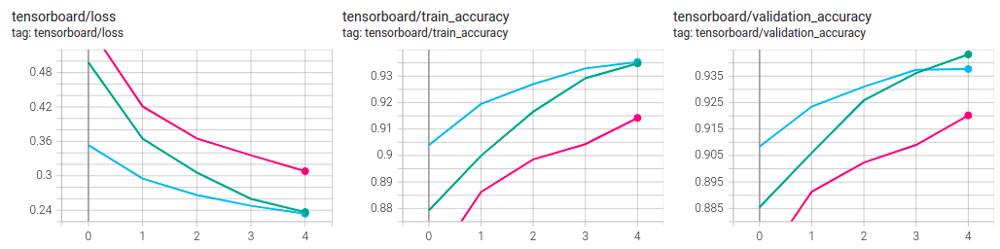

Відповідність кольорів: голубий колір - базова модель, рожевий колір - перша розширена модель, зелений колір - друга розширена модель.

### Вплив нормалізації за міні-батчами та дропауту

In [ ]:
nesterov_params = {"learning_rate": 0.01, "momentum": 0.9, "use_nesterov": True}
common_params = {"tensorboard_logs": True, "verbose": True, "activation": tf.nn.relu, "kernel_initializer": "he_normal",
                 "max_epochs": 5, "device_name": "/device:GPU:0", "conv_layers": extended_model_conv_2, "optimizer": tf.train.MomentumOptimizer, "op_params": nesterov_params}

In [ ]:
model = CustomCNN(**common_params)
model.train(X_train, y_train)
print(f"Accuracy on training set: {model.score(X_train, y_train)[1]:.5}, on test set: {model.score(X_test, y_test)[1]:.5}")

Training model: model-SjCurXr1cxRe7wFEyQuK
0 epoch - loss: 0.18087, train acc: 0.94685, validation acc: 0.948, time: 1.5549s
1 epoch - loss: 0.12499, train acc: 0.96369, validation acc: 0.964, time: 1.4305s
2 epoch - loss: 0.094445, train acc: 0.97324, validation acc: 0.97333, time: 1.1905s
3 epoch - loss: 0.080166, train acc: 0.97739, validation acc: 0.9765, time: 1.1311s
4 epoch - loss: 0.070741, train acc: 0.98039, validation acc: 0.97967, time: 1.124s
Total training time: 6.91s
Accuracy on training set: 0.98032, on test set: 0.9789


In [ ]:
dropout = [[(0, 0.5)], [(1, 0.5)], [(0, 0.5), (1, 0.5)]]
common_params["verbose"] = False

for d in dropout:
    model = CustomCNN(**common_params, dropout=d)
    train_acc, valid_acc = model.train(X_train, y_train, return_scores=True)
    print(f"For dropout = {d}: train_acc: {train_acc:.3}, validation acc: {valid_acc:.3}.")

For dropout = [(0, 0.5)]: train_acc: 0.975, validation acc: 0.977.
For dropout = [(1, 0.5)]: train_acc: 0.972, validation acc: 0.974.
For dropout = [(0, 0.5), (1, 0.5)]: train_acc: 0.962, validation acc: 0.962.


In [ ]:
common_params["verbose"] = True
dropout = [(0, 0.5)]
model = CustomCNN(**common_params, dropout=dropout)
model.train(X_train, y_train)
print(f"Accuracy on training set: {model.score(X_train, y_train)[1]:.5}, on test set: {model.score(X_test, y_test)[1]:.5}")

Training model: model-bHjepEh1zu4oarjKvObD
0 epoch - loss: 0.28124, train acc: 0.93287, validation acc: 0.9375, time: 1.7534s
1 epoch - loss: 0.19868, train acc: 0.95367, validation acc: 0.95633, time: 1.5188s
2 epoch - loss: 0.16065, train acc: 0.96063, validation acc: 0.963, time: 1.3047s
3 epoch - loss: 0.12979, train acc: 0.97002, validation acc: 0.97183, time: 1.3061s
4 epoch - loss: 0.12129, train acc: 0.96972, validation acc: 0.971, time: 1.3114s
Total training time: 7.67s
Accuracy on training set: 0.96985, on test set: 0.9712


In [ ]:
model = CustomCNN(**common_params, batch_normalization=True)
model.train(X_train, y_train)
print(f"Accuracy on training set: {model.score(X_train, y_train)[1]:.5}, on test set: {model.score(X_test, y_test)[1]:.5}")

Training model: model-KmQlOpZoa1B6eohhUUM9
0 epoch - loss: 0.16313, train acc: 0.95098, validation acc: 0.95417, time: 2.4708s
1 epoch - loss: 0.095508, train acc: 0.9715, validation acc: 0.97083, time: 1.787s
2 epoch - loss: 0.074524, train acc: 0.9777, validation acc: 0.97666, time: 1.7324s
3 epoch - loss: 0.063523, train acc: 0.98081, validation acc: 0.98017, time: 1.701s
4 epoch - loss: 0.051205, train acc: 0.98432, validation acc: 0.981, time: 1.7256s
Total training time: 10.1s
Accuracy on training set: 0.98398, on test set: 0.9799


Використання прискореного градієнту Нестерова помітно покращило якість моделі, дропаут погіршив якість моделі, батч нормалізація трохи збільшила точність.

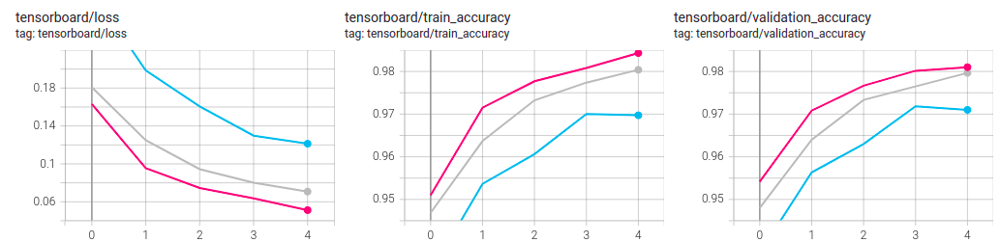

Відповідність кольорів: сірий колір - модель з адаптивним методом оптимізації, рожевий - модель з використанням нормалізації за міні-батчами, голубий - модель з використанням дропауту.

### Вплив параметрiв padding, strides та розмірності ядра згортки

За основу візьмемо модель, яка складається з чотирьох згорткових шарів (згортковий -> макс пулінг -> згортковий -> макс пулінг)

In [ ]:
nesterov_params = {"learning_rate": 0.01, "momentum": 0.9, "use_nesterov": True}
common_params = {"tensorboard_logs": True, "verbose": False, "activation": tf.nn.relu, "kernel_initializer": "he_normal", "batch_normalization": True,
                 "max_epochs": 10, "device_name": "/device:GPU:0", "optimizer": tf.train.MomentumOptimizer, "op_params": nesterov_params}

conv_params = {"type": ["conv", "max_pool", "conv", "max_pool"],
               "filters": [64, -1, 128, -1],
               "kernel_size": [(5, 5), (2, 2), (5, 5), (2, 2)],
               "strides": [(3, 3), (1, 1),  (1, 1), (1, 1)],
               "padding": ["valid", "valid", "valid", "valid"]}

Для того, щоб дослідити влив параметру padding спочатку навчимо модель, де доповнення для всіх шарів - valid.

In [ ]:
model = CustomCNN(**common_params, conv_layers=conv_params, dense_layers=[128])
train_acc, valid_acc = model.train(X_train, y_train, return_scores=True)
print(f"Model: {model.name}. Accuracy on training set: {train_acc:.3}, validation acc: {valid_acc:.3}.")

Model: model-5pJLCsjbUNPKhIgiM983. Accuracy on training set: 0.994, validation acc: 0.985.


Тепер для першого і другого шарів встановимо конгруентне доповнення

In [ ]:
conv_params["padding"] = ["same", "valid", "same", "valid"]
model = CustomCNN(**common_params, conv_layers=conv_params, dense_layers=[128])
train_acc, valid_acc = model.train(X_train, y_train, return_scores=True)
print(f"Model: {model.name}. Accuracy on training set: {train_acc:.3}, validation acc: {valid_acc:.3}.")

Model: model-sr6jBJG09ZRmFkOmUwKp. Accuracy on training set: 0.997, validation acc: 0.988.


Дізнаємося, як крок впливає на результати моделі. Для першого і другого шарів нехай крок = 1, а для шарів субдискретизації - 2.

In [ ]:
conv_params["strides"] = [(1, 1), (2, 2),  (1, 1), (2, 2)]
model = CustomCNN(**common_params, conv_layers=conv_params, dense_layers=[128])
train_acc, valid_acc = model.train(X_train, y_train, return_scores=True)
print(f"Model: {model.name}. Accuracy on training set: {train_acc:.3}, validation acc: {valid_acc:.3}.")

Model: model-X6pQ7QaICb0RlcKWcnXd. Accuracy on training set: 0.997, validation acc: 0.99.


Необхідно дослідити вплив розмірності ядра. Оскільки дану модель покращити вже буде складно, спробуємо її погіршити задавши великі за розміром ядра.

In [ ]:
conv_params["kernel_size"] = [(11, 11), (7, 7), (11, 11), (7, 7)]
model = CustomCNN(**common_params, conv_layers=conv_params, dense_layers=[128])
train_acc, valid_acc = model.train(X_train, y_train, return_scores=True)
print(f"Model: {model.name}. Accuracy on training set: {train_acc:.3}, validation acc: {valid_acc:.3}.")

Model: model-9bWzwb5RrUs1CwyJitEr. Accuracy on training set: 0.994, validation acc: 0.986.


Після встановлення для згорткових шарів конгруентного доповнення і зміни значень strides, якість моделі трохи зросла. Збільшення розмірностей фільрів очікувано трохи погіршило результати. На мою думку, якщо б встановити за таких значень kernel_size коректне доповнення для всіх шарів, то точність модель стала б набагато гіршою.

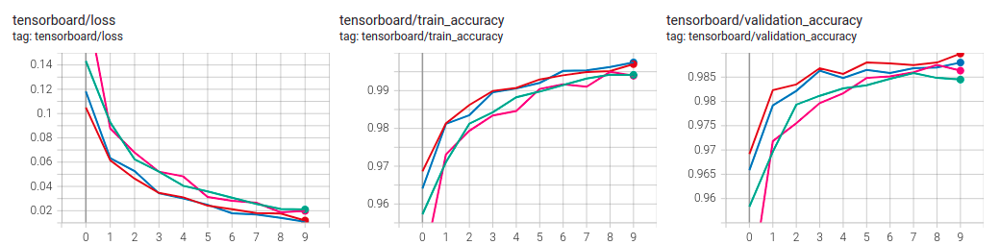

Відповідність кольорів: дослідження впливу значення доповнення: valid - зелена, same - синя, дослідження впливу значення кроку - червона, розмірність ядра - рожева. 

### Найкраща модель

In [ ]:
conv_params["kernel_size"] = [(5, 5), (2, 2), (5, 5), (2, 2)]
common_params["verbose"] = True
common_params["max_epochs"] = 15

best_model = CustomCNN(**common_params, conv_layers=conv_params, dense_layers=[128])
best_model.train(X_train, y_train)
print(f"Accuracy on training set: {best_model.score(X_train, y_train)[1]:.5}, on test set: {best_model.score(X_test, y_test)[1]:.5}")

Training model: model-e3eLtqJjFQW1gxpMpBiR
0 epoch - loss: 0.099784, train acc: 0.971, validation acc: 0.9705, time: 6.9365s
1 epoch - loss: 0.057216, train acc: 0.98311, validation acc: 0.98334, time: 6.8271s
2 epoch - loss: 0.042011, train acc: 0.98724, validation acc: 0.98584, time: 7.1845s
3 epoch - loss: 0.03083, train acc: 0.99141, validation acc: 0.98717, time: 6.5806s
4 epoch - loss: 0.025349, train acc: 0.99306, validation acc: 0.98734, time: 6.3898s
5 epoch - loss: 0.02224, train acc: 0.99369, validation acc: 0.98883, time: 6.1888s
6 epoch - loss: 0.021549, train acc: 0.99359, validation acc: 0.98717, time: 6.3299s
7 epoch - loss: 0.015442, train acc: 0.996, validation acc: 0.98933, time: 6.2218s
8 epoch - loss: 0.011318, train acc: 0.99743, validation acc: 0.98833, time: 6.1965s
9 epoch - loss: 0.010418, train acc: 0.99776, validation acc: 0.98817, time: 6.2249s
10 epoch - loss: 0.0078388, train acc: 0.99857, validation acc: 0.99066, time: 6.2166s
11 epoch - loss: 0.0073955,

Total prediction time: 1.7927


,micro,macro
Precision,0.998383,0.998402
Recall,0.998383,0.998367
F1-score,0.998383,0.998384


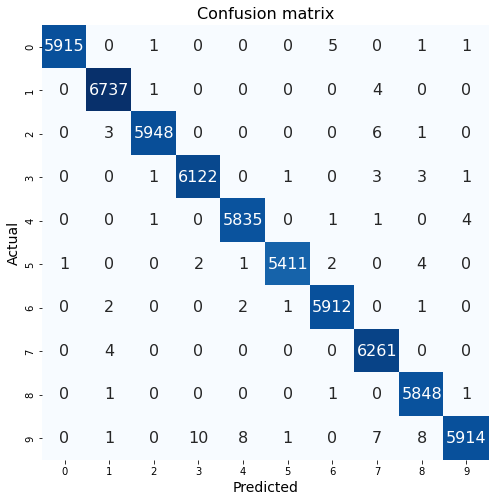

In [ ]:
_, _ = scoring(y_train, best_model.predict(X_train), print_res=True, average=["micro", "macro"])

Total prediction time: 0.46925


,micro,macro
Precision,0.99,0.989984
Recall,0.99,0.989955
F1-score,0.99,0.989943


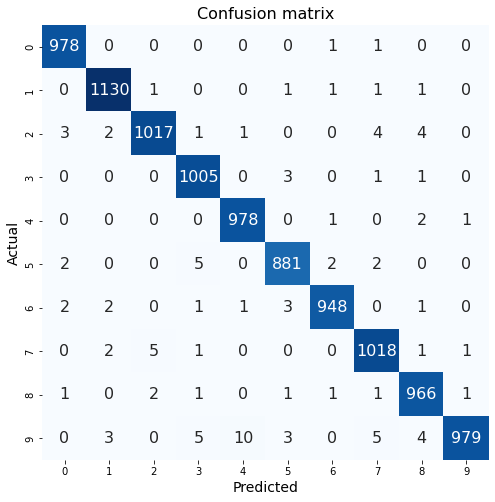

In [ ]:
_, _ = scoring(y_test, best_model.predict(X_test), print_res=True, average=["micro", "macro"])

Як і в попередній лабораторній, модель трохи плутае класи 9 и 4. Роспізнаємо випадкове зображення з тестової вибірки:

Total prediction time: 0.26654


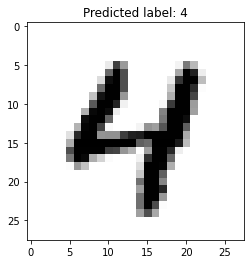

In [ ]:
random_indx = np.random.choice(X_test.shape[0] - 1)
random_picture, true_label = X_test[random_indx], y_test[random_indx]
predicted_label = best_model.predict(np.array([random_picture]))
imgplot = plt.imshow(random_picture.reshape(28, 28), cmap="binary")
_ = plt.title(f"Predicted label: {predicted_label[0]}")

### Реалізація засобами Keras
Для побудови нейронних мереж у Keras можна використовувати клас Sequential, у який поступово додавати необхідні шари. Далі потрібно викликати метод compile, де задати загальні налаштування моделі: функцію втрат, метрики якості, оптимізатор. А далі навчати класичними методами fit, для класифікації використовувати predict, враховуючи, що він повертає ймовірності для кожного класу, а не прогнозований клас. Для отримання графіків у TensorBoard необхідно передати у метод fit - tf2.keras.callbacks.TensorBoard(log_dir=*вказати необхідну папку*)

In [ ]:
import tensorflow as tf2

In [ ]:
model = tf2.keras.Sequential()
model.add(tf2.keras.layers.BatchNormalization())
model.add(tf2.keras.layers.Conv2D(64, (5, 5), (2, 2), 'same', activation='relu', kernel_initializer="he_normal", input_shape=(28, 28, 1)))
model.add(tf2.keras.layers.BatchNormalization())
model.add(tf2.keras.layers.MaxPool2D((2, 2), strides=(2, 2), padding='valid'))
model.add(tf2.keras.layers.BatchNormalization())
model.add(tf2.keras.layers.Conv2D(128, (5, 5), (1, 1), 'same', activation='relu', kernel_initializer="he_normal"))
model.add(tf2.keras.layers.BatchNormalization())
model.add(tf2.keras.layers.MaxPool2D((2, 2), strides=(1, 1), padding='valid'))
model.add(tf2.keras.layers.Flatten())
model.add(tf2.keras.layers.BatchNormalization())
model.add(tf2.keras.layers.Dense(128, activation='relu', kernel_initializer="he_normal"))
model.add(tf2.keras.layers.BatchNormalization())
model.add(tf2.keras.layers.Dense(10, activation='softmax', kernel_initializer="he_normal"))

model.compile(optimizer=tf2.keras.optimizers.SGD(learning_rate=0.001, momentum=0.9, nesterov=True), metrics=['accuracy'], loss='sparse_categorical_crossentropy')

In [ ]:
tensorboard_callback = tf2.keras.callbacks.TensorBoard(log_dir="./")
model.fit(
    X_train, y_train, batch_size=512,validation_split=0.1,
    callbacks=tensorboard_callback, epochs=15, shuffle=False
)

Epoch 1/15
106/106 [==============================] - 8s 28ms/step - loss: 0.4711 - accuracy: 0.8568 - val_loss: 0.9270 - val_accuracy: 0.7583
Epoch 2/15
106/106 [==============================] - 2s 23ms/step - loss: 0.1640 - accuracy: 0.9557 - val_loss: 0.3713 - val_accuracy: 0.9192
Epoch 3/15
106/106 [==============================] - 2s 22ms/step - loss: 0.1241 - accuracy: 0.9678 - val_loss: 0.1453 - val_accuracy: 0.9678
Epoch 4/15
106/106 [==============================] - 2s 23ms/step - loss: 0.1021 - accuracy: 0.9738 - val_loss: 0.0971 - val_accuracy: 0.9778
Epoch 5/15
106/106 [==============================] - 2s 23ms/step - loss: 0.0876 - accuracy: 0.9787 - val_loss: 0.0827 - val_accuracy: 0.9795
Epoch 6/15
106/106 [==============================] - 2s 22ms/step - loss: 0.0770 - accuracy: 0.9817 - val_loss: 0.0758 - val_accuracy: 0.9820
Epoch 7/15
106/106 [==============================] - 2s 22ms/step - loss: 0.0687 - accuracy: 0.9839 - val_loss: 0.0713 - val_accuracy: 0.9827

In [ ]:
_, train_acc = model.evaluate(X_train, y_train)
_, test_acc = model.evaluate(X_test, y_test)
f"Accuracy on train set: {train_acc}, on test set: {test_acc}"

313/313 [==============================] - 1s 5ms/step - loss: 0.0606 - accuracy: 0.9819


'Accuracy on train set: 0.9926833510398865, on test set: 0.9818999767303467'

,micro,macro
Precision,0.992683,0.992642
Recall,0.992683,0.992630
F1-score,0.992683,0.992635


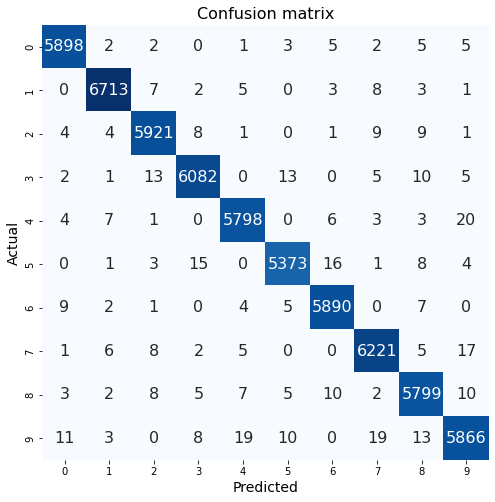

In [ ]:
 _, _ = scoring(y_train, np.argmax(model.predict(X_train), axis=1), print_res=True,  average=["micro", "macro"])

,micro,macro
Precision,0.9819,0.981682
Recall,0.9819,0.981841
F1-score,0.9819,0.981740


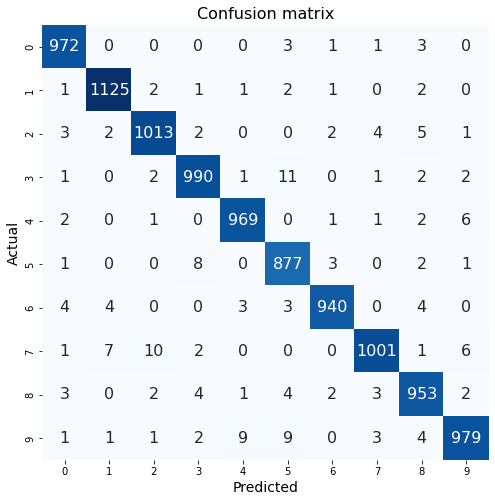

In [ ]:
 _, _ = scoring(y_test, np.argmax(model.predict(X_test), axis=1), print_res=True, average=["micro", "macro"])

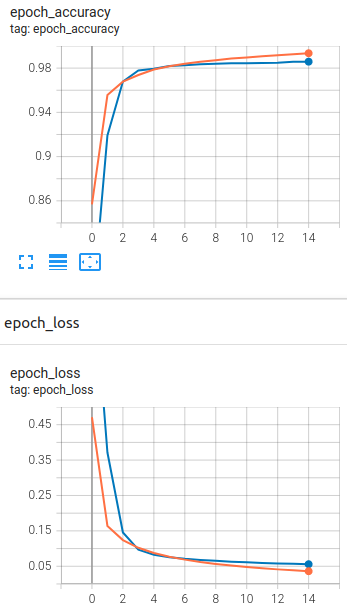

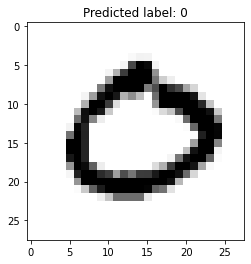

In [ ]:
random_indx = np.random.choice(X_test.shape[0] - 1)
random_picture, true_label = X_test[random_indx], y_test[random_indx]
predicted_label =np.argmax( model.predict(np.array([random_picture])))
imgplot = plt.imshow(random_picture.reshape(28, 28), cmap="binary")
_ = plt.title(f"Predicted label: {predicted_label}")

Результати моделей реалізованих власноруч і через Keras майже не відрізняються, тому, на мою думку, немає сенсу будувати усі моделі ще й через Keras, оскільки висновки, які там можно буде зробити, не зміняться.

## NATURAL IMAGES

### Базова та розширені згорткові моделі

Розглянемо три моделі:
* Базову, яка містить один згортковий шар з 64 фільтрів, розміром ядра 5х5, кроком 1 та конгруентним доповненням.
* Розширену, яка містить два згорткових шари, перший - аналогічний попередньому, але з кроком 3, другий такий самий, але кількість фільтрів більше вдвічі разів, а крок дорівнює одному.
* Розширену, аналогічну попередній, але після кожного згорткового шару додаємо шар макс пулінгу з ядром 3х3, кроком 1 та конгруентним доповненням.

In [ ]:
common_params = {"tensorboard_logs": True, "verbose": True, "activation": tf.nn.relu,
                 "kernel_initializer": "he_normal", "max_epochs": 5, "device_name": "/device:GPU:0", "op_params": {"learning_rate": 0.001}}

basic_model_conv = {"type": ["conv"], "filters": [64], "kernel_size": [(5, 5)], "strides": [(1, 1)], "padding": ["same"]}

extended_model_conv_1 = {"type": ["conv", "conv"], "filters": [64, 128], "kernel_size": [(5, 5), (5, 5)], "strides": [(3, 3), (1, 1)], "padding": ["same", "same"]}

extended_model_conv_2 = {"type": ["conv", "max_pool", "conv", "max_pool"], "filters": [64, -1, 128, -1],  "kernel_size": [(5, 5), (3, 3), (5, 5), (3, 3)],
                         "strides": [(3, 3), (1, 1), (1, 1), (1, 1)], "padding": ["same", "same", "same", "same"]}

In [ ]:
model = CustomCNN(conv_layers=basic_model_conv, **common_params)
model.train(X_train_b, y_train_b)
print(f"Accuracy on training set: {model.score(X_train_b, y_train_b)[1]:.5}, on test set: {model.score(X_test_b, y_test_b)[1]:.5}")

Training model: model-lQdTeyG12VDYtSgR4QRt
0 epoch - loss: 18.212, train acc: 0.22448, validation acc: 0.2192, time: 4.779s
1 epoch - loss: 1.8881, train acc: 0.49044, validation acc: 0.44928, time: 4.5594s
2 epoch - loss: 1.3694, train acc: 0.59413, validation acc: 0.56522, time: 4.5676s
3 epoch - loss: 0.94242, train acc: 0.6966, validation acc: 0.65761, time: 4.5508s
4 epoch - loss: 1.0262, train acc: 0.66176, validation acc: 0.61957, time: 4.5583s
Total training time: 23.5s
Accuracy on training set: 0.65755, on test set: 0.6558


In [ ]:
model = CustomCNN(conv_layers=extended_model_conv_1, **common_params)
model.train(X_train_b, y_train_b)
print(f"Accuracy on training set: {model.score(X_train_b, y_train_b)[1]:.5}, on test set: {model.score(X_test_b, y_test_b)[1]:.5}")

Training model: model-5R6BXnvjePyfND3CDXGC
0 epoch - loss: 1.7938, train acc: 0.43769, validation acc: 0.42935, time: 3.1531s
1 epoch - loss: 1.3031, train acc: 0.59513, validation acc: 0.56884, time: 3.1328s
2 epoch - loss: 1.1241, train acc: 0.62694, validation acc: 0.61957, time: 3.1393s
3 epoch - loss: 1.0071, train acc: 0.6819, validation acc: 0.66304, time: 3.1463s
4 epoch - loss: 0.96898, train acc: 0.68553, validation acc: 0.63406, time: 3.1298s
Total training time: 16.1s
Accuracy on training set: 0.68038, on test set: 0.67609


In [ ]:
model = CustomCNN(conv_layers=extended_model_conv_2, **common_params)
model.train(X_train_b, y_train_b)
print(f"Accuracy on training set: {model.score(X_train_b, y_train_b)[1]:.5}, on test set: {model.score(X_test_b, y_test_b)[1]:.5}")

Training model: model-iNRRxWuXr5GR7wEelkJu
0 epoch - loss: 1.7783, train acc: 0.3928, validation acc: 0.39493, time: 4.8423s
1 epoch - loss: 1.6112, train acc: 0.48902, validation acc: 0.48188, time: 4.7832s
2 epoch - loss: 1.5159, train acc: 0.53735, validation acc: 0.53442, time: 4.5341s
3 epoch - loss: 1.4333, train acc: 0.55748, validation acc: 0.53804, time: 4.4579s
4 epoch - loss: 1.3856, train acc: 0.55365, validation acc: 0.54167, time: 4.4443s
Total training time: 23.7s
Accuracy on training set: 0.55246, on test set: 0.5442


Не дивлячись на те, що остання модель за своею структурою найскладніша, на практиці вона показала найгірші результати.

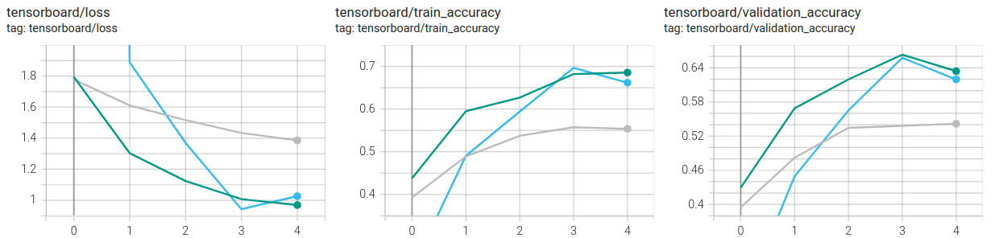

Відповідність кольорів: голубий колір - базова модель, зелений колір - перша розширена модель, сірий колір - друга розширена модель

### Вплив нормалізації за міні-батчами та дропауту

В минулій лабораторній роботі було визначено, що найращим адаптивним методом оптимізації для цього набору даних є прискорений градієнт Нестерова. За основу моделі візьмемо розширену моделі з двома згортковими шарами.

In [ ]:
nesterov_params = {"learning_rate": 0.001, "momentum": 0.9, "use_nesterov": True}
common_params = {"tensorboard_logs": True, "verbose": True, "activation": tf.nn.relu, "kernel_initializer": "he_normal",
                 "max_epochs": 10, "device_name": "/device:GPU:0", "conv_layers": extended_model_conv_1, "optimizer": tf.train.MomentumOptimizer, "op_params": nesterov_params}

In [ ]:
model = CustomCNN(**common_params)
model.train(X_train_b, y_train_b)
print(f"Accuracy on training set: {model.score(X_train_b, y_train_b)[1]:.5}, on test set: {model.score(X_test_b, y_test_b)[1]:.5}")

Training model: model-NnV98UOy04pZdTxmIEYh
0 epoch - loss: 1.8399, train acc: 0.31065, validation acc: 0.28442, time: 4.3492s
1 epoch - loss: 1.395, train acc: 0.667, validation acc: 0.64855, time: 3.6498s
2 epoch - loss: 1.0014, train acc: 0.70284, validation acc: 0.68116, time: 3.3784s
3 epoch - loss: 0.91077, train acc: 0.68854, validation acc: 0.66304, time: 3.3599s
4 epoch - loss: 0.71958, train acc: 0.75962, validation acc: 0.71739, time: 3.3543s
5 epoch - loss: 0.64044, train acc: 0.78941, validation acc: 0.73551, time: 3.3809s
6 epoch - loss: 0.594, train acc: 0.8019, validation acc: 0.76812, time: 3.3688s
7 epoch - loss: 0.5373, train acc: 0.82786, validation acc: 0.78261, time: 3.383s
8 epoch - loss: 0.4971, train acc: 0.84538, validation acc: 0.78804, time: 3.3786s
9 epoch - loss: 0.45865, train acc: 0.85706, validation acc: 0.80435, time: 3.3687s
Total training time: 36.3s
Accuracy on training set: 0.85178, on test set: 0.82101


Підберемо значення імовірності для шарів дропауту.

In [ ]:
dropout = [[(0, 0.5)], [(1, 0.5)], [(0, 0.5), (1, 0.5)]]
common_params["verbose"] = False

for d in dropout:
    model = CustomCNN(**common_params, dropout=d)
    train_acc, valid_acc = model.train(X_train_b, y_train_b, return_scores=True)
    print(f"For dropout = {d}: train_acc: {train_acc:.3}, validation acc: {valid_acc:.3}.")

For dropout = [(0, 0.5)]: train_acc: 0.61, validation acc: 0.582.
For dropout = [(1, 0.5)]: train_acc: 0.838, validation acc: 0.801.
For dropout = [(0, 0.5), (1, 0.5)]: train_acc: 0.692, validation acc: 0.676.


Найкращі результати дав шар дропауту після згорткових шарів зі імовірністю відключення нейрону - 0.5.

In [ ]:
common_params["verbose"] = True
dropout = [(1, 0.7)]
model = CustomCNN(**common_params, dropout=dropout)
model.train(X_train_b, y_train_b)
print(f"Accuracy on training set: {model.score(X_train_b, y_train_b)[1]:.5}, on test set: {model.score(X_test_b, y_test_b)[1]:.5}")

Training model: model-zL8mPSNsZDKhPnjTwLdw
0 epoch - loss: 1.8895, train acc: 0.3034, validation acc: 0.29529, time: 3.9385s
1 epoch - loss: 1.6192, train acc: 0.5601, validation acc: 0.55254, time: 3.8466s
2 epoch - loss: 1.1899, train acc: 0.69921, validation acc: 0.7029, time: 3.8755s
3 epoch - loss: 0.90307, train acc: 0.74029, validation acc: 0.72283, time: 3.882s
4 epoch - loss: 0.73843, train acc: 0.76565, validation acc: 0.74457, time: 3.9001s
5 epoch - loss: 0.64715, train acc: 0.79364, validation acc: 0.76993, time: 3.9247s
6 epoch - loss: 0.5693, train acc: 0.82887, validation acc: 0.80616, time: 3.9068s
7 epoch - loss: 0.52044, train acc: 0.84357, validation acc: 0.80435, time: 3.9142s
8 epoch - loss: 0.481, train acc: 0.8484, validation acc: 0.80616, time: 3.9058s
9 epoch - loss: 0.44216, train acc: 0.86753, validation acc: 0.83333, time: 3.9264s
Total training time: 39.6s
Accuracy on training set: 0.8641, on test set: 0.83696


Нормалізація за міні-батчами:

In [ ]:
model = CustomCNN(**common_params, batch_normalization=True)
model.train(X_train_b, y_train_b)
print(f"Accuracy on training set: {model.score(X_train_b, y_train_b)[1]:.5}, on test set: {model.score(X_test_b, y_test_b)[1]:.5}")

Training model: model-xKmJqvZmy9LJZqwfPrb8
0 epoch - loss: 1.6568, train acc: 0.51963, validation acc: 0.5163, time: 6.6125s
1 epoch - loss: 1.2561, train acc: 0.6811, validation acc: 0.68297, time: 3.9312s
2 epoch - loss: 0.92275, train acc: 0.72539, validation acc: 0.71014, time: 3.6546s
3 epoch - loss: 0.73625, train acc: 0.76867, validation acc: 0.74819, time: 3.7074s
4 epoch - loss: 0.62856, train acc: 0.79524, validation acc: 0.76993, time: 3.6573s
5 epoch - loss: 0.55049, train acc: 0.82625, validation acc: 0.79348, time: 3.6489s
6 epoch - loss: 0.49699, train acc: 0.84639, validation acc: 0.80978, time: 3.6699s
7 epoch - loss: 0.48892, train acc: 0.82665, validation acc: 0.77355, time: 3.6747s
8 epoch - loss: 0.42056, train acc: 0.86873, validation acc: 0.82609, time: 3.6736s
9 epoch - loss: 0.39765, train acc: 0.87719, validation acc: 0.82246, time: 3.6823s
Total training time: 41.4s
Accuracy on training set: 0.87171, on test set: 0.83406


Використання прискореного градієнту Нестерова помітно покращило якість моделі, дропаут та батч нормалізація не дали особливого впливу.

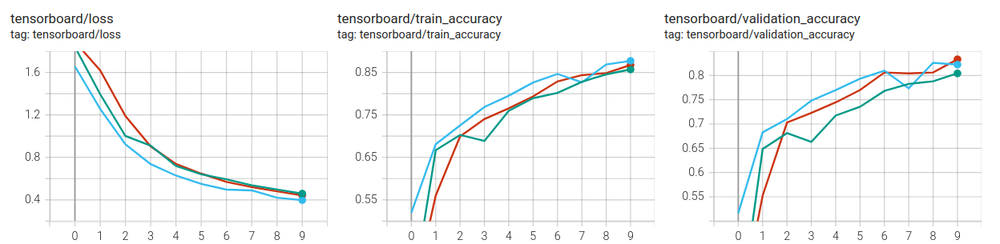

Відповідність кольорів: зелений кольор - модель з адаптивним методом оптимізації, червоний - модель з використанням нормалізації за міні-батчами, голубий - модель з використанням дропауту.

### Вплив параметрів padding, strides та розмірності ядра згортки

За основу візьмемо модель, яка складається з чотирьох згорткових шарів (згортковий -> макс пулінг -> згортковий -> макс пулінг)

In [ ]:
nesterov_params = {"learning_rate": 0.001, "momentum": 0.9, "use_nesterov": True}
common_params = {"tensorboard_logs": True, "verbose": False, "activation": tf.nn.relu, "kernel_initializer": "he_normal", "dropout": [(3, 0.3), (4, 0.5)],
                 "max_epochs": 25, "device_name": "/device:GPU:0", "optimizer": tf.train.MomentumOptimizer, "op_params": nesterov_params}
conv_params = {"type": ["conv", "max_pool", "conv", "max_pool"],
               "filters": [32, -1, 64, -1],
               "kernel_size": [(5, 5), (2, 2), (3, 3), (2, 2)],
               "strides": [(3, 3), (1, 1),  (1, 1), (1, 1)],
               "padding": ["valid", "valid", "valid", "valid"]}

Для того, щоб дослідити влив параметру padding спочатку навчимо модель, де доповнення для всіх шарів - valid.

In [ ]:
model = CustomCNN(**common_params, conv_layers=conv_params, dense_layers=[256])
train_acc, valid_acc = model.train(X_train_b, y_train_b, return_scores=True)
print(f"Model: {model.name}. Accuracy on training set: {train_acc:.3}, validation acc: {valid_acc:.3}.")

Model: model-BWK9IJe2bVC2q8srFScI. Accuracy on training set: 0.868, validation acc: 0.833.


Тепер встановимо доповнення для всіх шарів - same.

In [ ]:
conv_params["padding"] =["same", "same", "same", "same"]

model = CustomCNN(**common_params, conv_layers=conv_params, dense_layers=[256])
train_acc, valid_acc = model.train(X_train_b, y_train_b, return_scores=True)
print(f"Model: {model.name}. Accuracy on training set: {train_acc:.3}, validation acc: {valid_acc:.3}.")

Model: model-65WRXmJ3ShNG1fqWEgGQ. Accuracy on training set: 0.899, validation acc: 0.88.


Використання конгруентної згортки покращило якість моделі на валідаційному наборі майже на 5%.

Дізнаємося, як крок впливає на результати моделі. Для всіх шарів задамо strides = 3.

In [ ]:
conv_params["strides"] = [(3, 3), (3, 3), (3, 3), (3, 3)]

model = CustomCNN(**common_params, conv_layers=conv_params, dense_layers=[256])
train_acc, valid_acc = model.train(X_train_b, y_train_b, return_scores=True)
print(f"Model: {model.name}. Accuracy on training set: {train_acc:.3}, validation acc: {valid_acc:.3}.")

Model: model-Cu1xsDvlX7PE5i5ozdz4. Accuracy on training set: 0.602, validation acc: 0.621.


Це значно погіршило якість моделі.

Дослідимо вплив розміру ядра. Для кожного шару збільшимо його значення на 2 одиниці.

In [ ]:
conv_params["strides"] = [(3, 3), (1, 1), (1, 1), (1, 1)]
conv_params["kernel_size"] = [(7, 7), (4, 4), (5, 5), (4, 4)]

model = CustomCNN(**common_params, conv_layers=padding_conv, dense_layers=[256])
train_acc, valid_acc = model.train(X_train_b, y_train_b, return_scores=True)
print(f"Model: {model.name}. Accuracy on training set: {train_acc:.3}, validation acc: {valid_acc:.3}.")

Model: model-LFF7pXHsyExumG3SvSRU. Accuracy on training set: 0.908, validation acc: 0.879.


Отже, для цього набору даних конгруентна згортка покращила точність моделі, збільшення кроку - погіршило, розмірність ядра, загалом, не вплинуло на якість моделі, але пришвидшило процес навчання.

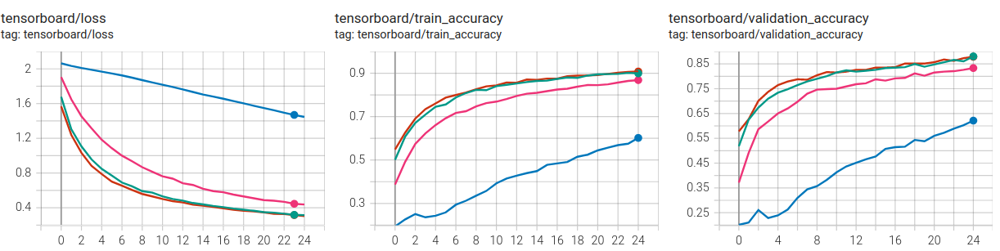

Відповідність кольорів: дослідження впливу значення доповнення: valid - рожева, same - зелена, дослідження впливу значення кроку - синя, розмірність ядра - червона. 

###  Найкраща модель

Тепер навчимо найращу модель на більшій кількості ітерацій.

In [ ]:
conv_params["padding"] =["same", "same", "same", "same"]
conv_params["strides"] = [(3, 3), (1, 1), (1, 1), (1, 1)]
conv_params["kernel_size"] = [(7, 7), (4, 4), (5, 5), (4, 4)]
conv_params["verbose"] = True

In [ ]:
best_model = CustomCNN(**common_params, conv_layers=conv_params, dense_layers=[256])
best_model.train(X_train_b, y_train_b)
print(f"Accuracy on training set: {best_model.score(X_train_b, y_train_b)[1]:.5}, on test set: {best_model.score(X_test_b, y_test_b)[1]:.5}")

Training model: model-PZcCSRBPkWynP280R1K6
0 epoch - loss: 1.9812, train acc: 0.27784, validation acc: 0.27355, time: 4.0527s
1 epoch - loss: 1.6878, train acc: 0.45883, validation acc: 0.43841, time: 4.1035s
2 epoch - loss: 1.322, train acc: 0.61849, validation acc: 0.60688, time: 3.9821s
3 epoch - loss: 1.0442, train acc: 0.70606, validation acc: 0.68478, time: 3.9762s
4 epoch - loss: 0.84166, train acc: 0.75458, validation acc: 0.72826, time: 3.9163s
5 epoch - loss: 0.70864, train acc: 0.77451, validation acc: 0.75, time: 3.9506s
6 epoch - loss: 0.60949, train acc: 0.8025, validation acc: 0.78623, time: 3.9119s
7 epoch - loss: 0.54895, train acc: 0.82223, validation acc: 0.80797, time: 3.8819s
8 epoch - loss: 0.50074, train acc: 0.83511, validation acc: 0.82246, time: 4.1416s
9 epoch - loss: 0.45271, train acc: 0.85524, validation acc: 0.83333, time: 3.9382s
10 epoch - loss: 0.42453, train acc: 0.86169, validation acc: 0.83877, time: 4.0699s
11 epoch - loss: 0.39844, train acc: 0.86

Total prediction time: 1.4847


,micro,macro
Precision,0.90125,0.893096
Recall,0.90125,0.889863
F1-score,0.90125,0.889245


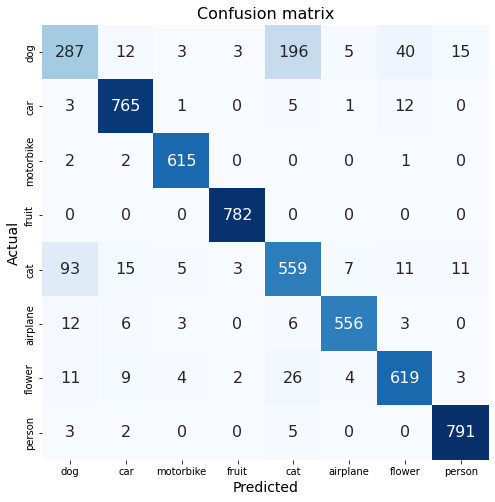

In [ ]:
_, _ = scoring(y_train_b, best_model.predict(X_train_b), print_res=True, labels=labels, average=["micro", "macro"])

Total prediction time: 0.70118


,micro,macro
Precision,0.886957,0.878000
Recall,0.886957,0.877757
F1-score,0.886957,0.877714


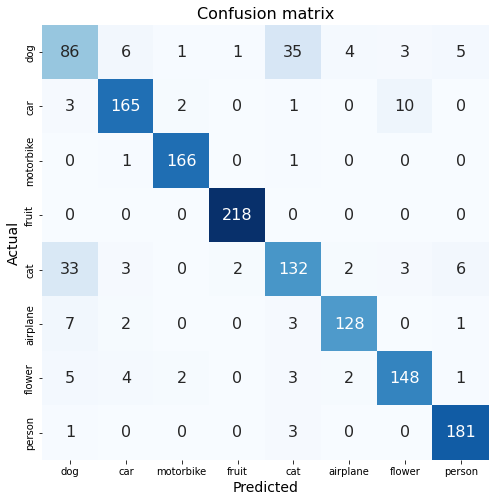

In [ ]:
_, _ = scoring(y_test_b, best_model.predict(X_test_b), print_res=True, labels=labels, average=["micro", "macro"])

Як і в минулій лабораторній роботі залишилися проблеми з розділенням котів та собак.

Розпізнаємо випадкове зображення з тестового набору даних:

Total prediction time: 0.279


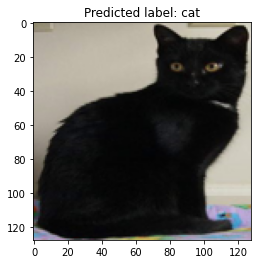

In [ ]:
random_indx = np.random.choice(X_test_b.shape[0] - 1)
random_picture, true_label = X_test_b[random_indx], y_test_b[random_indx]
predicted_label = best_model.predict(np.array([random_picture]))
imgplot = plt.imshow(random_picture.reshape(128, 128, 3))
_ = plt.title(f"Predicted label: {labels[predicted_label[0]]}")

### Реалізація засобами keras

In [ ]:
import tensorflow as tf2

Побудуємо найращу модель:

In [ ]:
model =tf2.keras.Sequential()
model.add(tf2.keras.layers.Conv2D(32, (7, 7), (3, 3), 'same', activation='relu', kernel_initializer="he_normal", input_shape=(128, 128, 3)))
model.add(tf2.keras.layers.MaxPool2D((4, 4), strides=(1, 1), padding='same'))
model.add(tf2.keras.layers.Conv2D(64, (5, 5), (1, 1), 'same', activation='relu', kernel_initializer="he_normal"))
model.add(tf2.keras.layers.MaxPool2D((2, 2), strides=(1, 1), padding='same'))
model.add(tf2.keras.layers.Dropout(0.3))
model.add(tf2.keras.layers.Flatten())
model.add(tf2.keras.layers.Dense(256, activation='relu', kernel_initializer="he_normal"))
model.add(tf2.keras.layers.Dropout(0.5))
model.add(tf2.keras.layers.Dense(8, activation='softmax', kernel_initializer="he_normal"))
tensorboard_callback = tf2.keras.callbacks.TensorBoard(log_dir="./")
model.compile(optimizer=tf2.keras.optimizers.SGD(learning_rate=0.001, momentum=0.9, nesterov=True), metrics=['accuracy'], loss='sparse_categorical_crossentropy')

In [ ]:
model.fit(
    X_train_b, y_train_b, batch_size=512,validation_split=0.1,
    callbacks=tensorboard_callback, epochs=25, shuffle=False
)

Epoch 1/25
10/10 [==============================] - 133s 13s/step - loss: 4.0205 - accuracy: 0.1725 - val_loss: 1.9456 - val_accuracy: 0.3297
Epoch 2/25
10/10 [==============================] - 128s 13s/step - loss: 1.8066 - accuracy: 0.3380 - val_loss: 1.4855 - val_accuracy: 0.6286
Epoch 3/25
10/10 [==============================] - 134s 13s/step - loss: 1.4039 - accuracy: 0.5241 - val_loss: 1.0644 - val_accuracy: 0.6993
Epoch 4/25
10/10 [==============================] - 132s 13s/step - loss: 1.0846 - accuracy: 0.6346 - val_loss: 0.8011 - val_accuracy: 0.7699
Epoch 5/25
10/10 [==============================] - 132s 13s/step - loss: 0.9056 - accuracy: 0.6869 - val_loss: 0.6886 - val_accuracy: 0.7699
Epoch 6/25
10/10 [==============================] - 131s 13s/step - loss: 0.7929 - accuracy: 0.7314 - val_loss: 0.6001 - val_accuracy: 0.8062
Epoch 7/25
10/10 [==============================] - 132s 13s/step - loss: 0.7024 - accuracy: 0.7566 - val_loss: 0.5439 - val_accuracy: 0.8098
Epoch 

In [ ]:
_, train_acc = model.evaluate(X_train_b, y_train_b)
_, test_acc = model.evaluate(X_test_b, y_test_b)
f"Accuracy on train set: {train_acc}, on test set: {test_acc}"

44/44 [==============================] - 12s 267ms/step - loss: 0.3203 - accuracy: 0.8797


'Accuracy on train set: 0.9199130535125732, on test set: 0.8797101378440857'

,micro,macro
Precision,0.919913,0.917924
Recall,0.919913,0.916372
F1-score,0.919913,0.914560


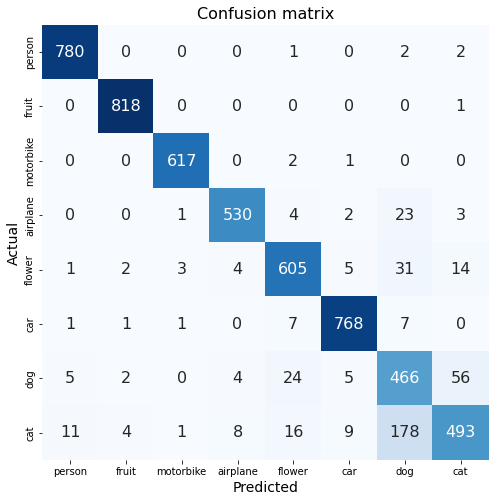

In [ ]:
 _, _ = scoring(y_train_b, np.argmax(model.predict(X_train_b), axis=1), print_res=True, labels=labels, average=["micro", "macro"])

,micro,macro
Precision,0.87971,0.873861
Recall,0.87971,0.871139
F1-score,0.87971,0.869460


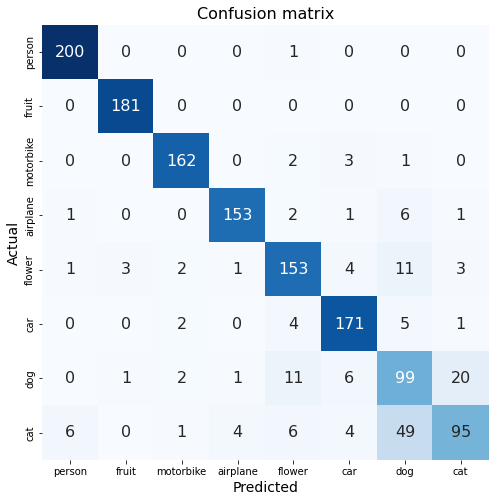

In [ ]:
 _, _ = scoring(y_test_b, np.argmax(model.predict(X_test_b), axis=1), print_res=True, labels=labels, average=["micro", "macro"])

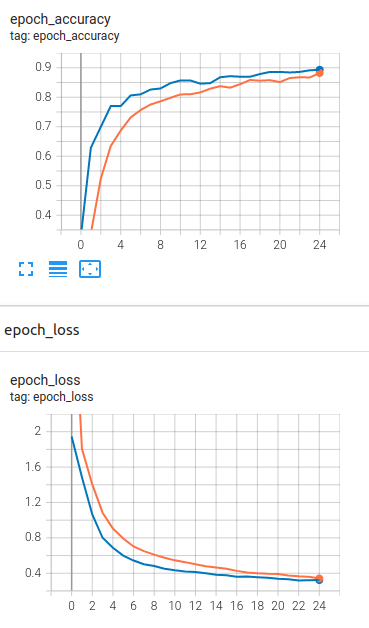

# Висновки
* Для обох наборів MNIST та Natural Images перенавчання відсутнє і для базової, і для розширеної моделей, адже різниця якості моделей на тренувальному і тестовому наборі несуттєва.
* Вплив батч-нормалізації помітний для першого набору даних, там батч-нормалізація дала невеликий ефект, а дропаут виступив гарним регуляризатором для другого датасету, адже при додаванні адаптивного метода оптимізації в розширених моделях  навіть на 10 епохах навчання різниця між точністю на тренувальній та тестовій вибірках вже становила 3%, тоді як в фінальній моделі при 25 епохах усього десь 2%.
* Вплив параметрів padding та strides. В обох випадках конгруентне доповнення призводить до підвищення точності моделей, також менше значення кроку дає кращі результати, особливо для звичайних згорткових шарів. І це зрозуміло, оскільки так ми переносимо більше інформації на наступні шари. Але, наприклад, якщо модель перенавчана, то потрібно спробувати збільшити крок та встановити коректне доповнення на окремих шарах. На мою думку, цілком логічним є встановлення кроку шарів субдискретизації рівним розмірності ядра, оскільки тоді ми будемо обирати в кожному окремому блоці, який не перетинається з іншими, "домінантну" ознаку лише один раз(у випадку max pooling)
* Вплив розмірності ядра згортки. Особливого впливу цього параметру на якість моделі я не помітила. Але при великому розмірі ядра та конгруентному доповнені виникає багато розрахунків, на які потрібно багато часу.
* Результати, отримані при використанні Keras API майже не відрізняються від результатів отриманих за допомогою класу CustomCNN.
* Найкращі моделі мають однакову структуру: inputs -> conv -> max pooling -> conv -> max pooling -> dense -> outputs, але
    * Для MNIST: перед кожним прихованим шаром є шар батч-нормалізації
    * Для Natural Images: післядругогошару субдискретизації та після повнозв'язного шару розташовані шари дропауту.      
Якщо порівнювати результати з попередньою лабораторною роботою, то для MNIST отримали приріст у 1%, для Natural Images приріст складає суттєві 12%


In [ ]:
%reload_ext tensorboard
%tensorboard --logdir /content/

Reusing TensorBoard on port 6006 (pid 826), started 0:10:41 ago. (Use '!kill 826' to kill it.)

<IPython.core.display.Javascript object>